In [18]:
import numpy as np
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import plotly
import plotly.graph_objs as go

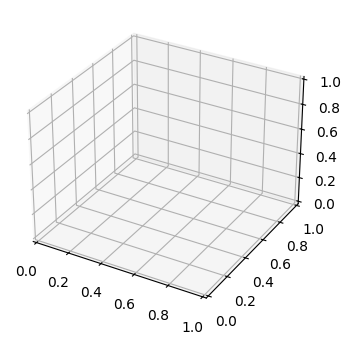

In [2]:
fig = plt.figure(figsize = (4,4))
ax = plt.axes(projection='3d')
plt.show()

In [3]:
w_true = np.array([3.5, 7])

In [4]:
X = np.ones((45, 2))
X[:, 0] = np.random.random((45))*10
y = X @ w_true + (np.random.random((45)) + np.random.randn((45))) * 6

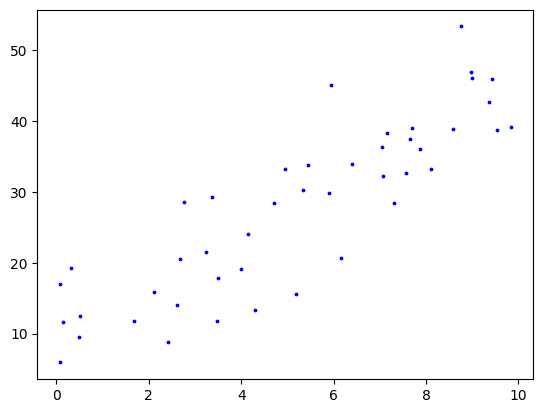

In [5]:
plt.scatter(X[:, 0], y, c="b", s=3)
plt.show()

In [6]:
# take a batch
y_b = y[:5]
X_b = X[:5]

In [7]:
@np.vectorize
def loss_(w1, w2):
    val = y_b - X_b @ np.array([w1, w2])
    return np.dot(val, val)

In [8]:
w_true

array([3.5, 7. ])

In [38]:
w1_grid = np.arange(-10, 10.1, 0.2)
w2_grid = np.arange(-50, 50.1, 0.2)

In [39]:
W1_grid, W2_grid = np.meshgrid(w1_grid, w2_grid)
w1_grid.shape, W1_grid.shape

((101,), (501, 101))

In [40]:
Z = loss_(W1_grid, W2_grid)
W1_grid.shape, Z.shape

((501, 101), (501, 101))

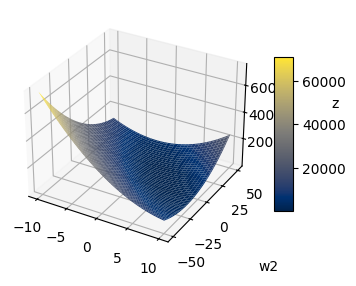

In [41]:
fig = plt.figure(figsize = (4,4))
ax = plt.axes(projection='3d')
ax.grid()

surf = ax.plot_surface(W1_grid, W2_grid, Z, cmap=plt.cm.cividis)

# Set axes label
ax.set_xlabel('w1', labelpad=20)
ax.set_ylabel('w2', labelpad=20)
ax.set_zlabel('z', labelpad=20)

fig.colorbar(surf, shrink=0.5, aspect=8)

plt.show()

In [61]:
Z.shape, np.where(Z == np.min(Z))

((501, 101), (array([295]), array([68])))

In [62]:
Z[295, 68], W1_grid[295, 68], W2_grid[295, 68]

(252.41028750748706, 3.5999999999999517, 9.000000000000838)

In [42]:
plotly.offline.init_notebook_mode()

In [51]:
fig = go.Figure(go.Surface(x = W1_grid, y = W2_grid, z = Z))
fig.update_layout(
    height=400, width=500,
    margin=dict(l=0, r=0, t=0, b=0),
)
fig.update_scenes(xaxis_title_text='W1',  
                  yaxis_title_text='W2',  
                  zaxis_title_text='Loss')
fig.show()